# Load Packages

In [1]:
import pandas as pd
import numpy as np
import gensim
from gensim import corpora 


from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt


# Choose the Dataset: 
already score>1000 and word count >30 

In [2]:
df = pd.read_parquet('AW.parquet')

In [2]:
df = pd.read_parquet('XX.parquet')

## more cleaning if wanted:

In [3]:
print(' Before cleaning length of Data:' ,len(df))
df = df.loc[(df.score>1000) & (df.resulttext_clean_wc>30)]
print(' After cleaning length of Data:' , len(df))

 Before cleaning length of Data: 6318
 After cleaning length of Data: 6318


## Create Corpus etc..

In [3]:

data_words = df.resulttext_clean
id2word = corpora.Dictionary(data_words)# Create Corpus
texts = data_words# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]# View

### Run the Gensim Model

In [4]:

lda_model = gensim.models.LdaMulticore(corpus=corpus,
                        id2word=id2word,
                        num_topics= 12, ## Choose Number of Topics
                        workers=8, ## n-1 Cpu cores
                        passes=52,
                        chunksize=500,
                        #alpha=alpha,
                        #eta=beta
                        )

In [6]:
## Create a dataframe of the topics and the top 15 words
n_words = 15
topic_words = pd.DataFrame({})
for i, topic in enumerate(lda_model.get_topics()):
    top_feature_ids = topic.argsort()[-n_words:][::-1]
    feature_values = topic[top_feature_ids]
    words = [id2word[id] for id in top_feature_ids]
    topic_df = pd.DataFrame({'value': feature_values, 'word': words, 'topic': i})
    topic_words = pd.concat([topic_words, topic_df], ignore_index=True)



# Run this if you want to manually name the topics otherwise skip:

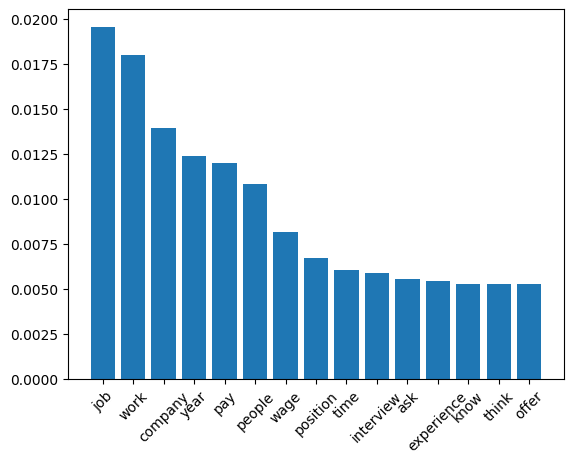

In [44]:
from IPython.display import clear_output

nametopic = dict()
for i in range(lda_model.num_topics):
    clear_output(wait=True)
    plt.bar(topic_words.loc[topic_words.topic==i].iloc[:,1].values,topic_words.loc[topic_words.topic==i].iloc[:,0].values)
    plt.xticks(rotation=45)
    plt.show()
    #print(lda_model.show_topic(i,topn=10),flush=True)
    temp = input('Name the topic: ')
    nametopic[i] = temp

nametopic = pd.Series(nametopic)

## Analyze goodness-of-fit

1) Distance between topics
2) Coherence 


/tmp/ipykernel_341255/1081822807.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  document_topic_matrix.groupby(document_topic_matrix['time'].dt.date).mean().rolling(40).mean().plot()


<Axes: xlabel='time'>

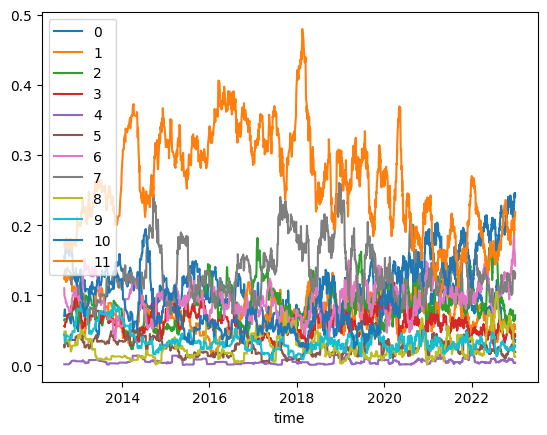

In [8]:
document_topic_matrix = pd.DataFrame([list(dict(lda_model.get_document_topics(doc, minimum_probability=0)).values()) for doc in corpus]) # Create Document Topic Data

document_topic_matrix['time'] = df.created_time.values  # Add Timestamps
document_topic_matrix.groupby(document_topic_matrix['time'].dt.date).mean().rolling(40).mean().plot() 
## Adjust the Rolling(..) for visability
## and add .rename(columns=nametopic) if naming was done

/tmp/ipykernel_334679/1281716274.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  meandocument_topic_matrix = document_topic_matrix.groupby(document_topic_matrix['time'].dt.date).mean().rolling(20).mean() # create rolling mean over time topic distribution


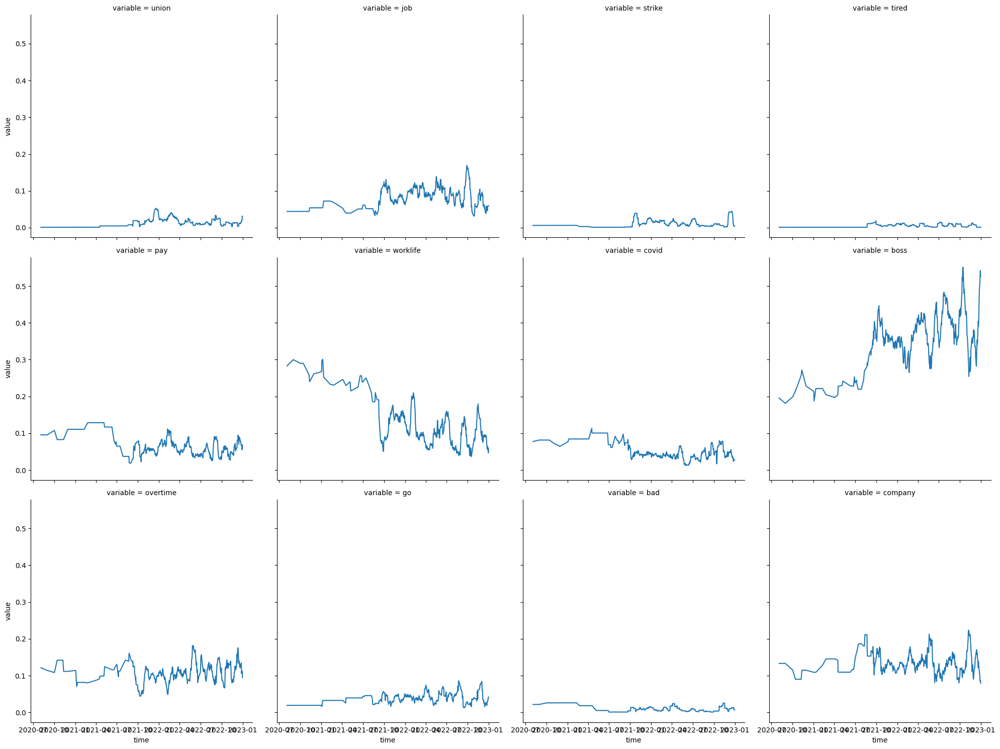

In [49]:
## Seaborn plot with naming 
import seaborn as sns
document_topic_matrix = pd.DataFrame([list(dict(lda_model.get_document_topics(doc, minimum_probability=0)).values()) for doc in corpus]) # Create Document Topic Data
document_topic_matrix['time'] = df.created_time.values  # Add Timestamps
meandocument_topic_matrix = document_topic_matrix.groupby(document_topic_matrix['time'].dt.date).mean().rolling(20).mean() # create rolling mean over time topic distribution
sns.relplot(data=pd.melt(meandocument_topic_matrix.rename(columns=nametopic), value_vars=nametopic.values,ignore_index=False).reset_index(), x="time", y="value", col='variable',kind='line' ,col_wrap=4)

## Show distribution of words within the topics

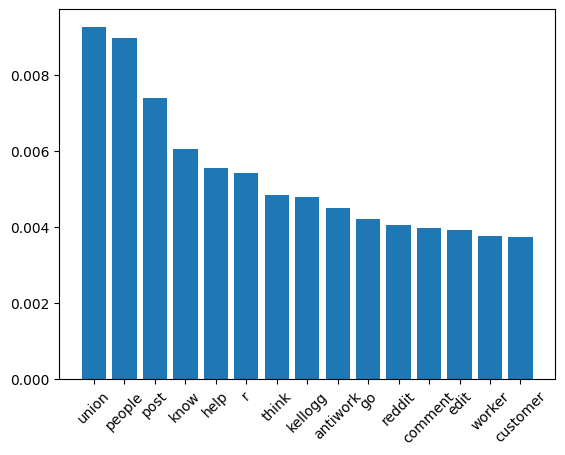

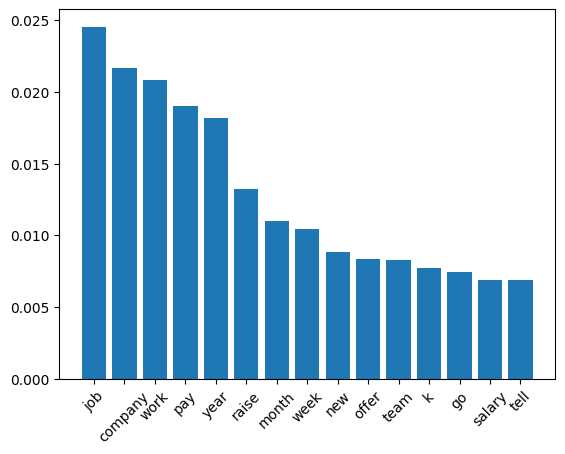

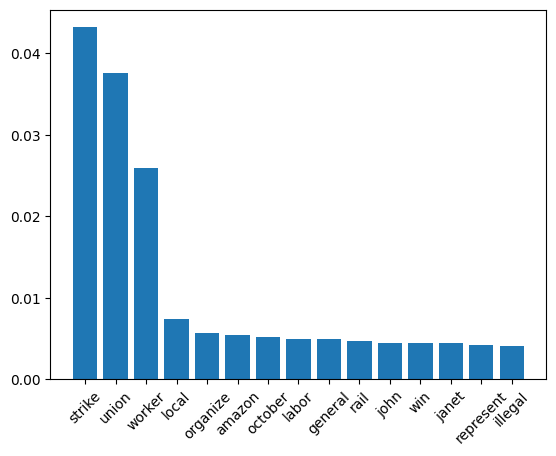

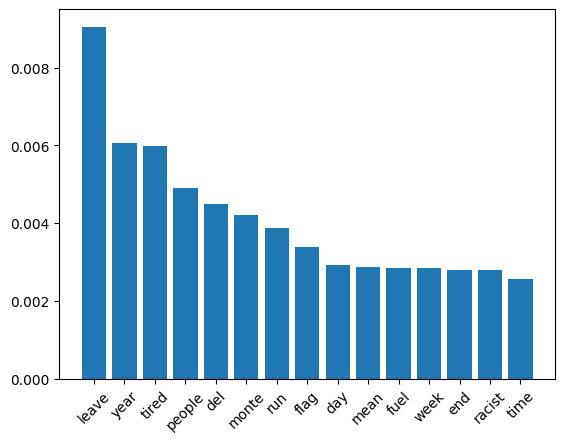

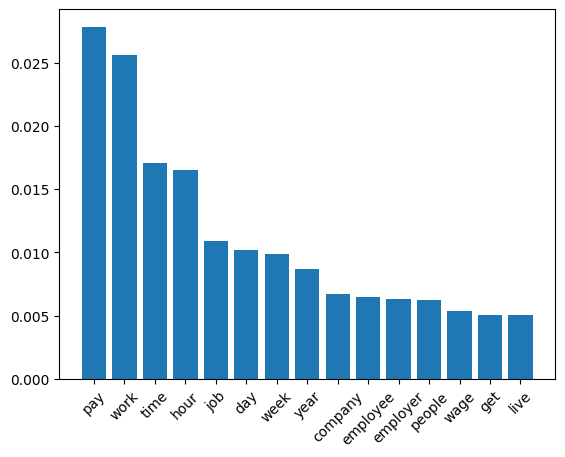

...

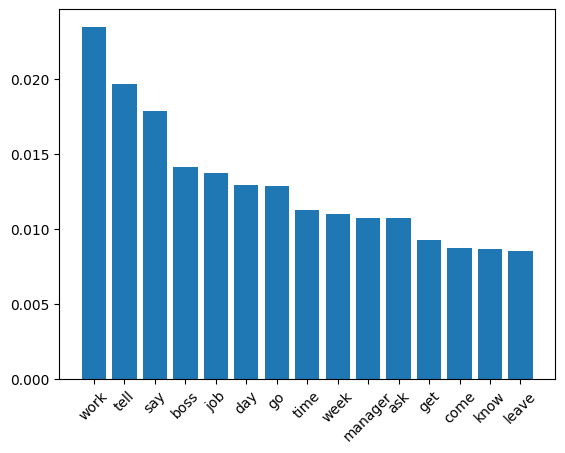

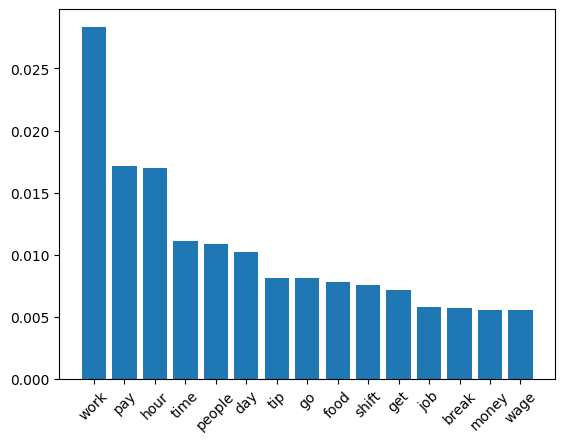

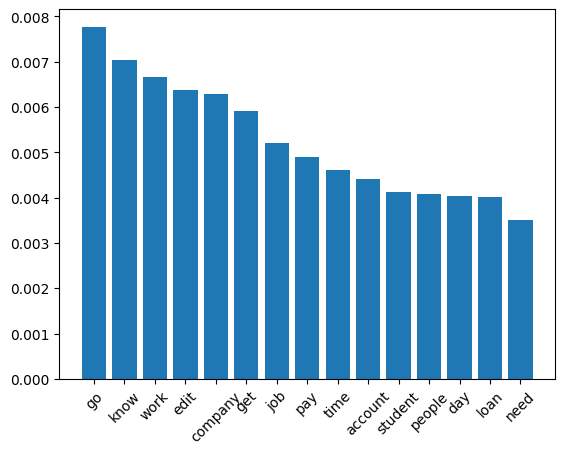

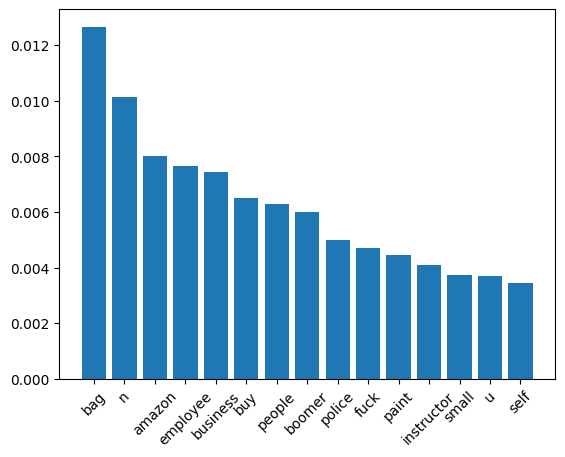

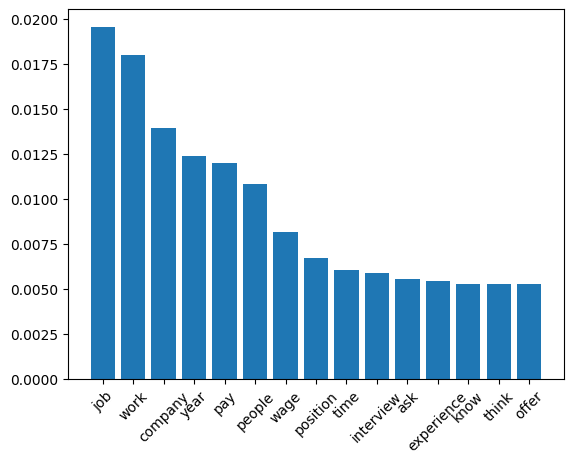

In [23]:
for i in range(lda_model.num_topics):
    plt.bar(topic_words.loc[topic_words.topic==i].iloc[:,1].values,topic_words.loc[topic_words.topic==i].iloc[:,0].values)
    plt.xticks(rotation=45)
    plt.show()

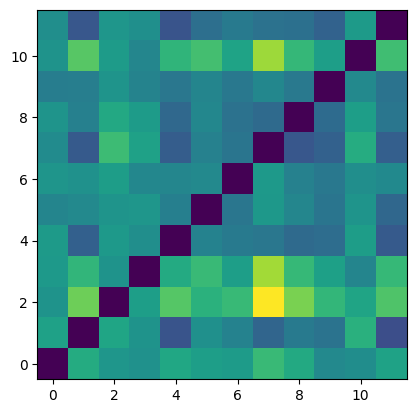

In [24]:
mdiff, annotation = lda_model.diff(lda_model, distance='kullback_leibler', num_words=20)
plt.imshow(mdiff,origin='lower')
print(mdiff.mean) ## E.G.

## How to calculate the coherence score:

In [9]:
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
print(coherence_model_lda.get_coherence())

0.362936621021541


## pyLDAvis

In [7]:

import pyLDAvis
pyLDAvis.enable_notebook()

LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
LDAvis_prepared

/home/martin/.local/lib/python3.10/site-packages/pyLDAvis/_prepare.py:244: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
8      0.133047 -0.042837       1        1  41.787375
5      0.028728  0.047690       2        1  10.400967
4      0.082111 -0.027237       3        1   8.346525
9      0.073593 -0.039773       4        1   7.966855
1      0.049695  0.064673       5        1   7.486271
11     0.099985 -0.075972       6        1   5.421408
7     -0.017020  0.064741       7        1   5.222529
0     -0.080811  0.163988       8        1   4.831936
3      0.032214 -0.018626       9        1   3.751729
10     0.010168 -0.100319      10        1   2.148702
2     -0.101049  0.088559      11        1   1.677445
6     -0.310661 -0.124888      12        1   0.958258, topic_info=            Term         Freq        Total Category  logprob  loglift
119         work  7053.000000  7053.000000  Default  30.0000  30.0000
150         hour  2084.000000  2084.000000  Default  29.0000  29.0000
168       people  2654.000000  2654.000000  Default  28.0000  28.0000
185         time  2961.000000  2961.000000  Default  27.0000  27.0000
237      manager  1772.000000  1772.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
612     mcdonald     8.997153    69.645405  Topic12  -5.8925   2.6013
660   restaurant    10.902791   202.717860  Topic12  -5.7004   1.7250
1374      social     9.320134   198.523476  Topic12  -5.8573   1.5891
278     antiwork     9.300656   227.373507  Topic12  -5.8594   1.4513
1341      medium     8.607391   133.102210  Topic12  -5.9368   1.9093

[991 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1492      1  0.151327  ability
1492      2  0.237800  ability
1492      3  0.151327  ability
1492      4  0.043236  ability
1492      7  0.108091  ability
...     ...       ...      ...
7134     12  0.768673    войны
7328     12  0.768672       вы
7145     12  0.926393        и
7156     12  0.768673       на
7179     12  0.860207   россии

[3365 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[9, 6, 5, 10, 2, 12, 8, 1, 4, 11, 3, 7])

# Top2Vec

using pretrained models for Topic Modeling

In [10]:
from top2vec import Top2Vec

In [11]:

resulttext_clean_text= df.resulttext_clean.apply(lambda x: ' '.join(x))
model = Top2Vec(documents=resulttext_clean_text.to_list(),workers=7,speed='learn')
topic_words, word_scores, topic_nums = model.get_topics()
topic_nums


2023-11-22 23:01:03,790 - top2vec - INFO - Pre-processing documents for training


2023-11-22 23:01:04,221 - top2vec - INFO - Creating joint document/word embedding
2023-11-22 23:01:11,605 - top2vec - INFO - Creating lower dimension embedding of documents
2023-11-22 23:01:23,018 - top2vec - INFO - Finding dense areas of documents
2023-11-22 23:01:23,065 - top2vec - INFO - Finding topics


array([0, 1])

In [13]:
model = Top2Vec(documents=resulttext_clean_text.to_list(),workers=7,use_embedding_model_tokenizer=True,embedding_model='all-MiniLM-L6-v2')
topic_words, word_scores, topic_nums = model.get_topics()
topic_nums

2023-11-22 23:02:01,000 - top2vec - INFO - Pre-processing documents for training
/home/martin/.local/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2023-11-22 23:02:01,518 - top2vec - INFO - Downloading all-MiniLM-L6-v2 model
2023-11-22 23:02:01,918 - top2vec - INFO - Creating joint document/word embedding
2023-11-22 23:02:45,937 - top2vec - INFO - Creating lower dimension embedding of documents
2023-11-22 23:02:52,723 - top2vec - INFO - Finding dense areas of documents
2023-11-22 23:02:52,772 - top2vec - INFO - Finding topics


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22])

## Create wordclouds of the Topics:

/home/martin/.local/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
/home/martin/.local/lib/python3.10/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/martin/.local/lib/python3.10/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/home/martin/.local/lib/python3.10/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pil

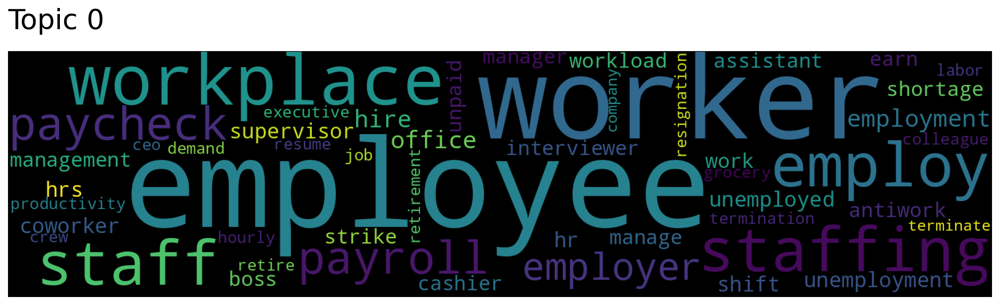

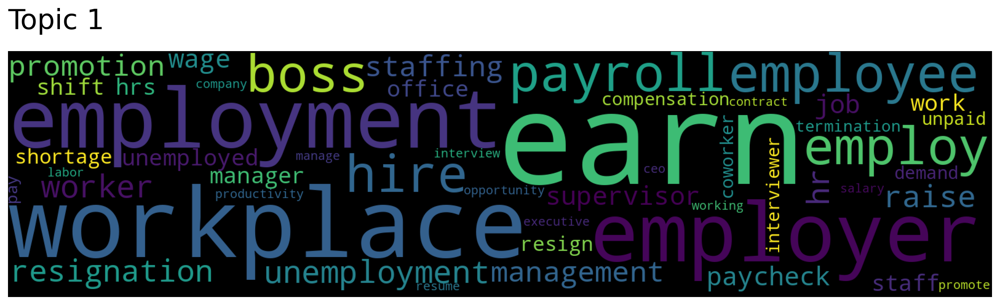

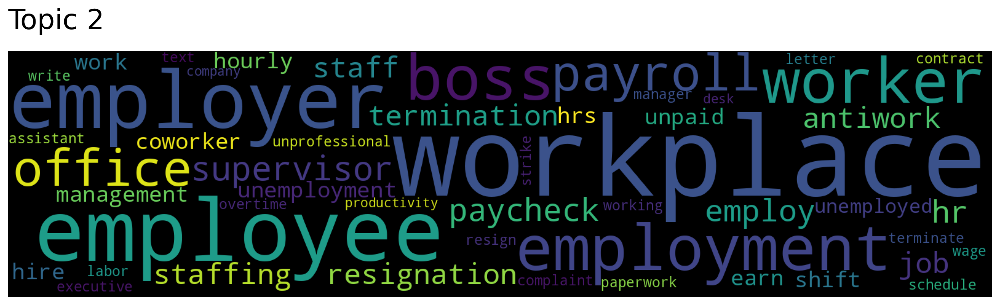

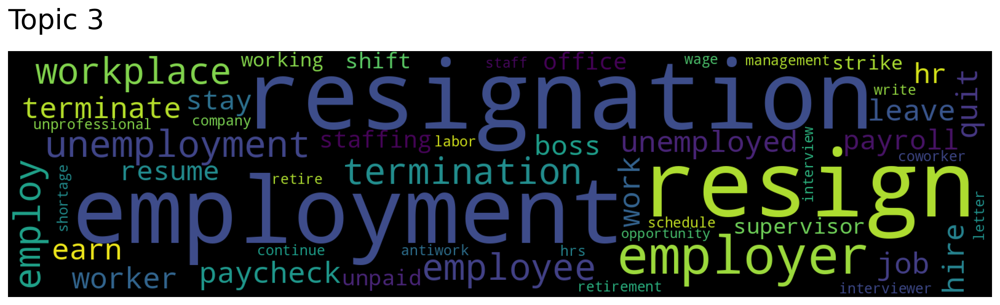

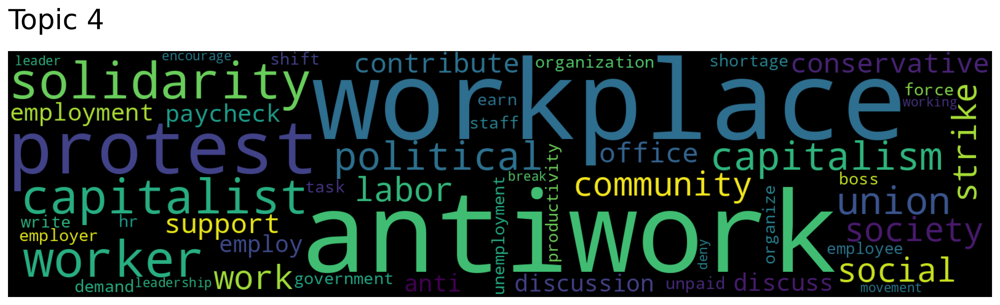

...

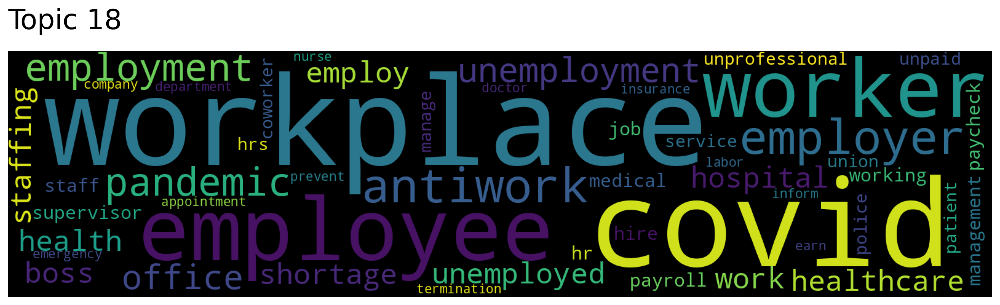

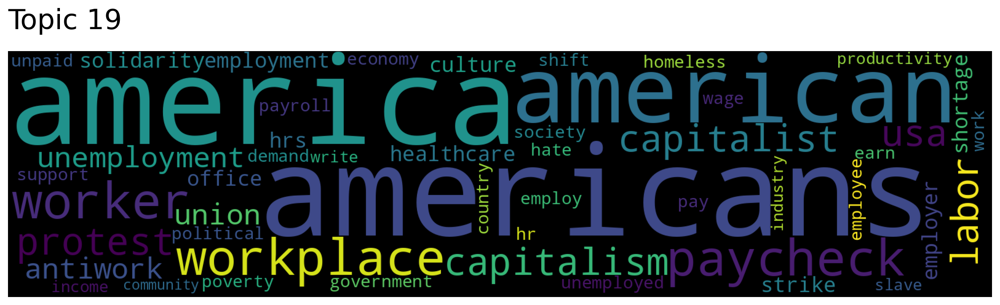

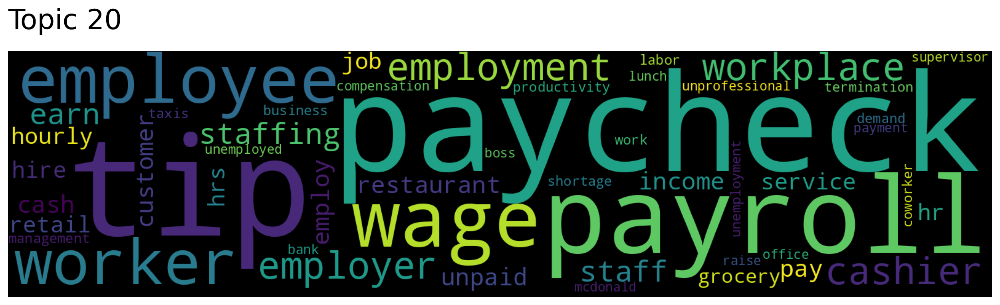

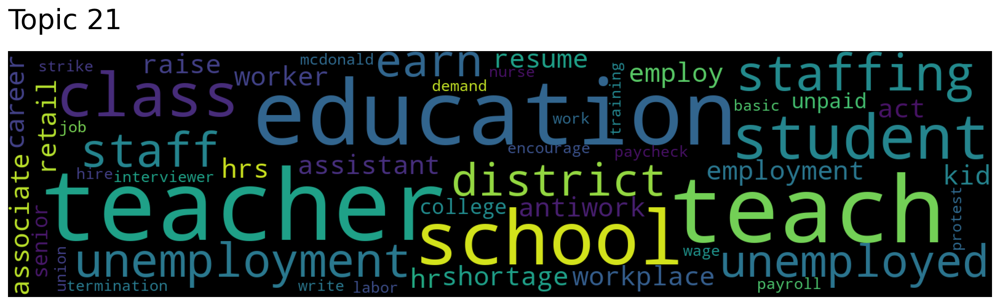

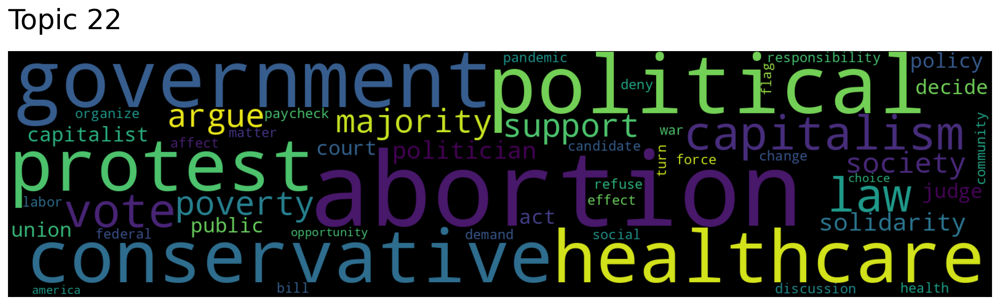

In [14]:
topic_words, word_scores, topic_nums = model.get_topics()#.search_topics(keywords=["medicine"], num_topics=5) # topic_scores,
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)